In [1]:
# @title
### EP2 MAC0417 / MAC5768
##################################################################
# AO PREENCHER ESSE CABEÇALHO COM O MEU NOME E O MEU NÚMERO USP,#
# DECLARO QUE SOU O ÚNICO AUTOR E RESPONSÁVEL PELA RESOLUÇÃO #
# DESTE EP. #
# TODAS AS PARTES FORAM DESENVOLVIDAS E IMPLEMENTADAS POR MIM, #
# SEGUINDO AS INSTRUÇÕES E QUE PORTANTO, NÃO CONSTITUEM #
# DESONESTIDADE ACADÊMICA OU PLÁGIO. #
# #
# DECLARO TAMBÉM, QUE SOU RESPONSÁVEL POR TODAS AS CÓPIAS #
# DESSE PROGRAMA, E QUE EU NÃO DISTRIBUI OU FACILITEI A #
# SUA DISTRIBUIÇÃO. ESTOU CIENTE QUE OS CASOS DE PLÁGIO E #
# DESONESTIDADE ACADÊMICA SERÃO TRATADOS SEGUNDO OS CRITÉRIOS #
# DEFINIDOS NO CÓDIGO DE ÉTICA DA USP. #
# #
# ENTENDO QUE JUPYTER NOTEBOOKS SEM ASSINATURA NÃO SERÃO #
# CORRIGIDOS E, AINDA ASSIM, PODERÃO SER PUNIDOS POR #
# DESONESTIDADE ACADÊMICA. #
# #
# #
# Nome : Bruna Luiza Bispo
# NUSP : 11488516
# Turma: MAC5768 - Visão e Processamento de Imagens (2024)
# Prof.: Ronaldo Fumio Hashimoto
##################################################################

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from cv2 import imwrite

In [3]:
#Formar a base de imagens;

#Ler imagens da pasta
imagens = []
for arquivo in os.listdir():
    if ".jpeg" in arquivo:
        imagem = plt.imread(arquivo)
        imagens.append([arquivo, imagem])

In [4]:
#Converter as imagens para níveis de cinza

imagens_cinza = []
rgb_gray = [0.2989, 0.5870, 0.1140]

for imagem in imagens:
    
    imagem_cinza = np.dot(imagem[1], rgb_gray)
    imagens_cinza.append([imagem[0], imagem_cinza])

In [5]:
#Converter as imagens para níveis de cinza da segunda forma para comparação

caminho_originalGrayDataset = 'originalGrayDataset'

if not os.path.isdir(caminho_originalGrayDataset):
    os.mkdir(caminho_originalGrayDataset)

imagens_cinza_2 = []

for imagem in imagens:
    imagem_cinza = cv2.cvtColor(imagem[1], cv2.COLOR_BGR2GRAY)
    imagens_cinza_2.append([imagem[0], imagem_cinza])
    imwrite(os.path.join(caminho_originalGrayDataset,imagem[0]), imagem_cinza)

In [6]:
imagens_cinza[0][1]

array([[3.9826, 3.9826, 4.9825, ..., 4.1675, 4.1675, 4.1675],
       [4.9825, 4.9825, 5.9824, ..., 4.1675, 4.1675, 4.1675],
       [5.9824, 5.9824, 5.9824, ..., 4.1675, 4.1675, 4.1675],
       ...,
       [7.9221, 7.9221, 7.9221, ..., 5.1782, 5.1782, 5.1782],
       [7.9221, 7.9221, 7.9221, ..., 5.1782, 4.1783, 4.1783],
       [5.9824, 3.9826, 5.2105, ..., 7.178 , 6.1781, 6.1781]])

In [7]:
imagens_cinza_2[0][1]

array([[5, 5, 6, ..., 5, 5, 5],
       [6, 6, 7, ..., 5, 5, 5],
       [7, 7, 7, ..., 5, 5, 5],
       ...,
       [9, 9, 9, ..., 5, 5, 5],
       [9, 9, 9, ..., 5, 4, 4],
       [7, 5, 7, ..., 7, 6, 6]], dtype=uint8)

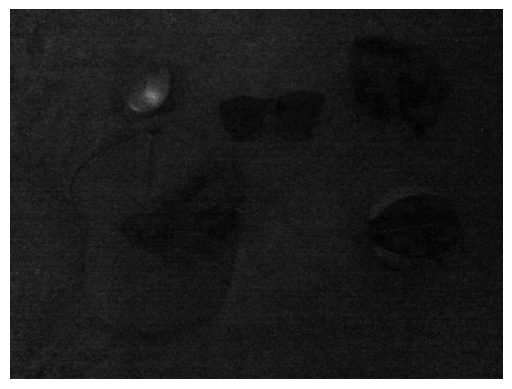

In [8]:
plt.imshow(imagens_cinza_2[0][1], cmap="grey")
plt.axis('off')
plt.show()

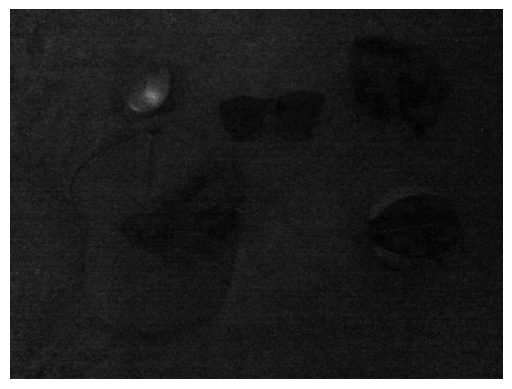

In [9]:
plt.imshow(imagens_cinza_2[0][1], cmap="grey")
plt.axis('off')
plt.show()

In [10]:
#Observação: Calculando por rgb_gray os valores não são inteiros como a biblioteca cv2, mas as imagens são semelhantes.
#Utilizarei os dados convertidos pela biblioteca cv2

In [11]:
#Contrast Stretching

caminho_augmentedDataset_stretching = 'augmentedDataset_stretching'

if not os.path.isdir(caminho_augmentedDataset_stretching):
    os.mkdir(caminho_augmentedDataset_stretching)

imagens_cinza_stretched = []

for imagem_cinza in imagens_cinza_2:
    min_val = np.min(imagem_cinza[1])
    max_val = np.max(imagem_cinza[1])
    imagem_stretched = ((imagem_cinza[1] - min_val) / (max_val - min_val) * 255).astype(np.uint8)
    imagens_cinza_stretched.append([imagem_cinza[0], imagem_stretched])
    imwrite(os.path.join(caminho_augmentedDataset_stretching,imagem_cinza[0]), imagem_stretched)

In [12]:
#Logaritmo da imagem
caminho_augmentedDataset_log = 'augmentedDataset_log'

if not os.path.isdir(caminho_augmentedDataset_log):
    os.mkdir(caminho_augmentedDataset_log)

imagens_cinza_log = []
c = 1

for imagem_cinza in imagens_cinza_2:
    imagem_cinza_log = c * np.log1p(imagem_cinza[1])
    imagens_cinza_log.append([imagem_cinza[0], imagem_cinza_log])
    imwrite(os.path.join(caminho_augmentedDataset_log,imagem_cinza[0]), imagem_cinza_log)

In [13]:
#Exponencial da imagem

caminho_augmentedDataset_expo = 'augmentedDataset_expo'

if not os.path.isdir(caminho_augmentedDataset_expo):
    os.mkdir(caminho_augmentedDataset_expo)

imagens_cinza_expo = []
c = 15
gamma = 0.1

for imagem_cinza in imagens_cinza_2:
    imagem_cinza_expo = c * (imagem_cinza[1]**gamma)
    imagens_cinza_expo.append([imagem_cinza[0], imagem_cinza_expo])
    imwrite(os.path.join(caminho_augmentedDataset_expo,imagem_cinza[0]), imagem_cinza_expo)

In [14]:
#Laplaciano da imagem

caminho_augmentedDataset_laplaciano = 'augmentedDataset_laplaciano'

if not os.path.isdir(caminho_augmentedDataset_laplaciano):
    os.mkdir(caminho_augmentedDataset_laplaciano)

imagens_cinza_laplaciano = []
kernel_laplaciano = [
    [0,1,0],
    [1,-4,1],
    [0,1,0]
]

for imagem_cinza in imagens_cinza_2:
    h, w = imagem_cinza[1].shape
    imagem_cinza_laplaciano = np.zeros((h, w), dtype=np.float32)
    for i in range(1, h-1):
        for j in range(1, w-1):
            imagem_cinza_laplaciano[i, j] = np.sum(kernel_laplaciano * imagem_cinza[1][i-1:i+2, j-1:j+2])
    imagens_cinza_laplaciano.append([imagem_cinza[0], imagem_cinza_laplaciano])
    imwrite(os.path.join(caminho_augmentedDataset_laplaciano, imagem_cinza[0]), imagem_cinza_laplaciano)

In [15]:
#Filtro da média da imagem

caminho_augmentedDataset_media = 'augmentedDataset_media'

if not os.path.isdir(caminho_augmentedDataset_media):
    os.mkdir(caminho_augmentedDataset_media)

imagens_cinza_media = []

kernel_media= [
    [1/9,1/9,1/9],
    [1/9,1/9,1/9],
    [1/9,1/9,1/9]
]

for imagem_cinza in imagens_cinza_2:
    h, w = imagem_cinza[1].shape
    imagem_cinza_media = np.zeros((h, w), dtype=np.float32)
    for i in range(1, h-1):
        for j in range(1, w-1):
            imagem_cinza_media[i, j] = np.sum(kernel_media * imagem_cinza[1][i-1:i+2, j-1:j+2])
    imagens_cinza_media.append([imagem_cinza[0], imagem_cinza_media])
    imwrite(os.path.join(caminho_augmentedDataset_media, imagem_cinza[0]), imagem_cinza_media)

In [5]:
#Função EP1

###Ajuste das imagem em tabela sumária para ficar em apenas uma imagem

#Criar um jupyter notebook com uma biblioteca de funções para ler a base e visualizá-la
#de uma forma de tabela sumária de dados. Por exemplo, para visualizar a base de
#dados como um todo,

meta_dados = pd.read_csv('meta_dados.csv')

lista_objetos = meta_dados['1_classe'].drop_duplicates().tolist() + meta_dados['2_classe'].drop_duplicates().tolist() + meta_dados['3_classe'].drop_duplicates().tolist() + meta_dados['4_classe'].drop_duplicates().tolist() + meta_dados['5_classe'].drop_duplicates().tolist()
lista_objetos = list(set(lista_objetos))

def juntar_imagem(meta_dados, lista_objetos, caminho):
    lista_linhas = []
    
    for objeto in lista_objetos:
    
        df_objeto = meta_dados[(meta_dados['1_classe'] == objeto) | (meta_dados['2_classe'] == objeto) | (meta_dados['3_classe'] == objeto) | (meta_dados['4_classe'] == objeto) | (meta_dados['5_classe'] == objeto)]
        lista_imagens_objeto = list(df_objeto['nome_arquivo'])
    
        imagens = []
        for arquivo in lista_imagens_objeto:
            if ".jpeg" in arquivo:
                imagem = plt.imread(os.path.join(caminho, arquivo))
                imagens.append(imagem)
                
        max_height = max(imagem.shape[0] for imagem in imagens)
        total_width = sum(imagem.shape[1] for imagem in imagens)
        linha_combinada = np.zeros((max_height, total_width), dtype=np.uint8)
        
        x_offset = 0
        for imagem in imagens:
            height, width, = imagem.shape
            linha_combinada[:height, x_offset:x_offset+width] = imagem
            x_offset += width
        lista_linhas.append(linha_combinada)
    
    max_width = max(linha.shape[1] for linha in lista_linhas)
    total_height = sum(linha.shape[0] for linha in lista_linhas)
    imagem_final = np.zeros((total_height, max_width), dtype=np.uint8)
    
    y_offset = 0
    for linha in lista_linhas:
        height, width = linha.shape
        imagem_final[y_offset:y_offset+height, :width] = linha
        y_offset += height

    return imagem_final

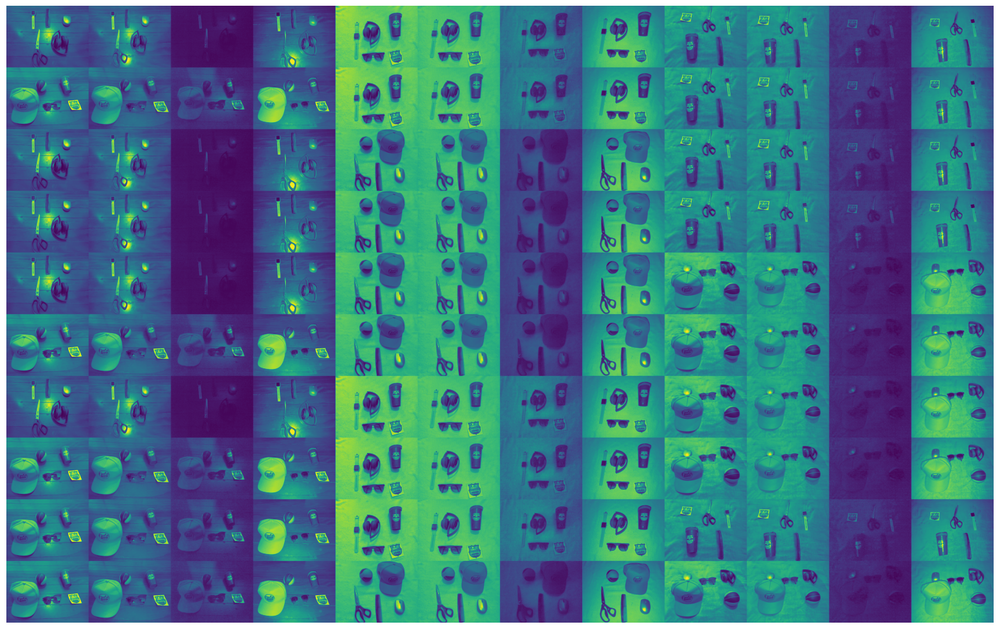

In [7]:
#Contrast Stretching

imagem_final = juntar_imagem(meta_dados, lista_objetos, 'augmentedDataset_stretching')

# Exibir a imagem final
plt.figure(figsize=(20, 20))
plt.imshow(imagem_final)
plt.axis('off')
plt.show()

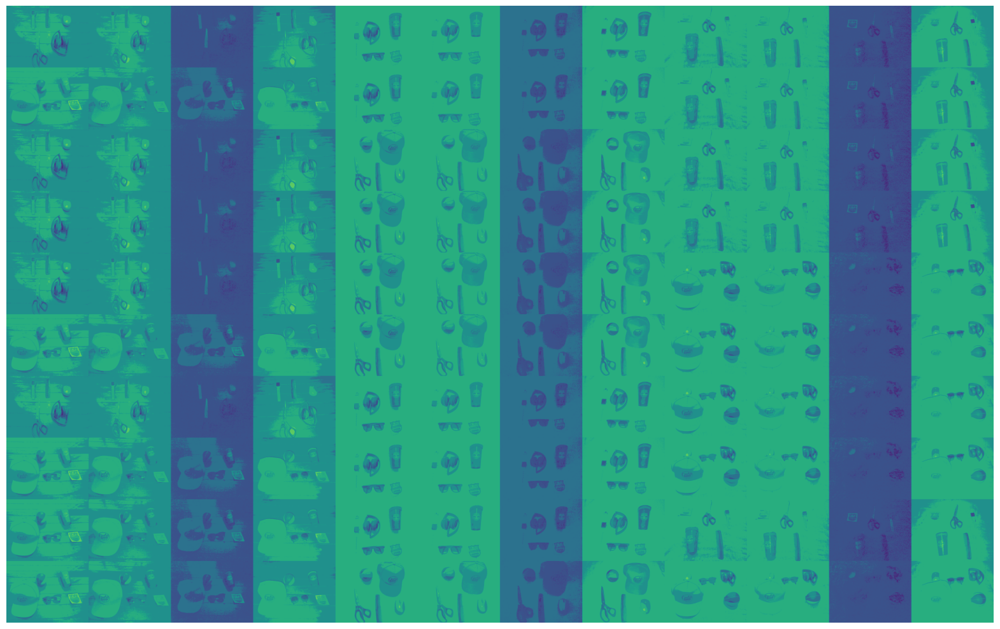

In [8]:
#Logaritmo

imagem_final = juntar_imagem(meta_dados, lista_objetos, 'augmentedDataset_log')

# Exibir a imagem final
plt.figure(figsize=(20, 20))
plt.imshow(imagem_final)
plt.axis('off')
plt.show()

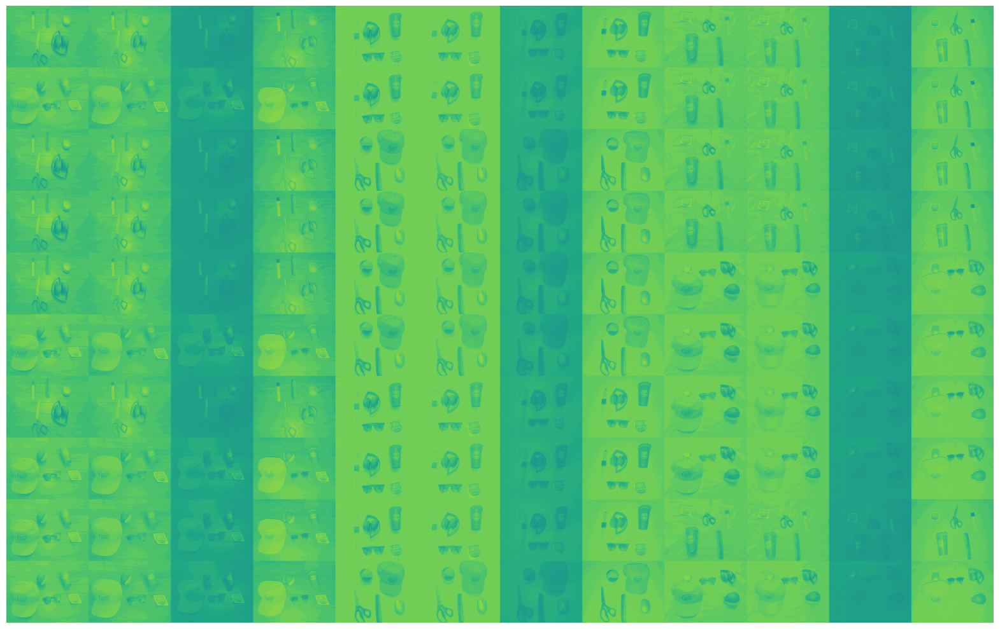

In [9]:
#Exponencial

imagem_final = juntar_imagem(meta_dados, lista_objetos, 'augmentedDataset_expo')

# Exibir a imagem final
plt.figure(figsize=(20, 20))
plt.imshow(imagem_final)
plt.axis('off')
plt.show()

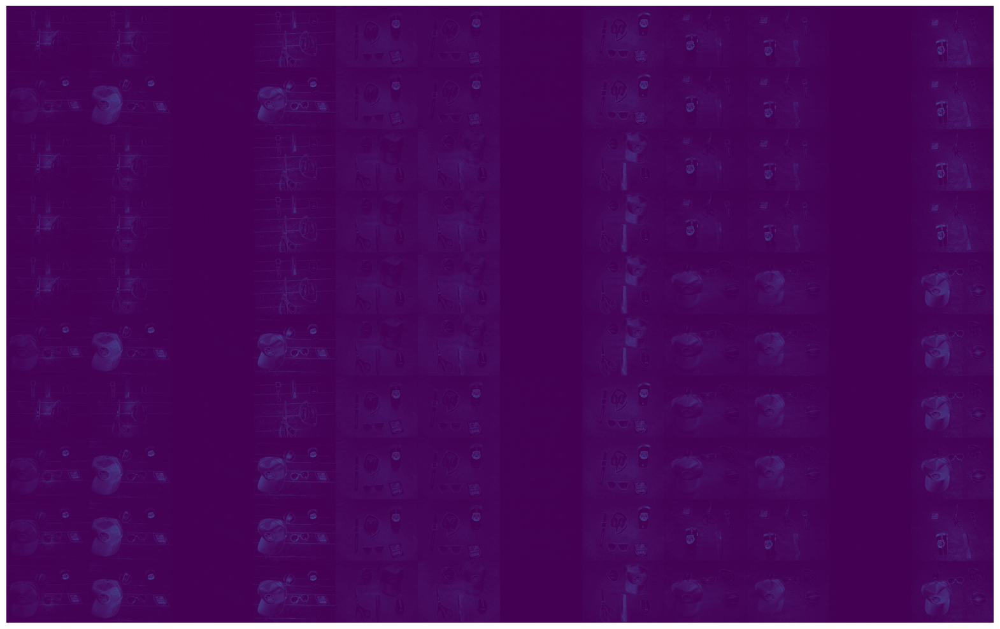

In [10]:
#Laplaciano 

imagem_final = juntar_imagem(meta_dados, lista_objetos, 'augmentedDataset_laplaciano')

# Exibir a imagem final
plt.figure(figsize=(20, 20))
plt.imshow(imagem_final)
plt.axis('off')
plt.show()

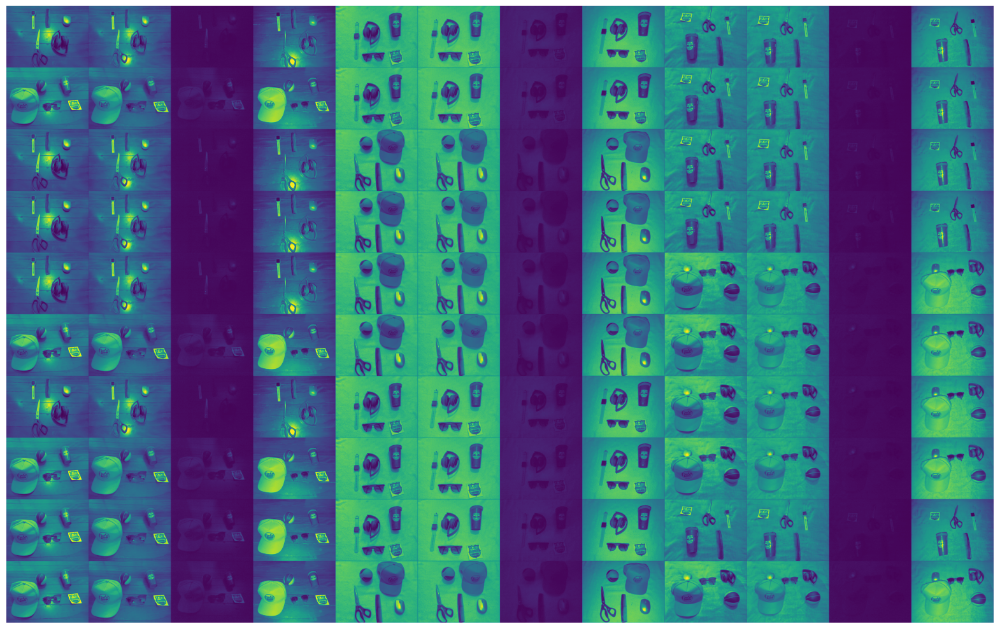

In [11]:
#Filtro da média 

imagem_final = juntar_imagem(meta_dados, lista_objetos, 'augmentedDataset_media')

# Exibir a imagem final
plt.figure(figsize=(20, 20))
plt.imshow(imagem_final)
plt.axis('off')
plt.show()